# Introduction
In this project we will create Customer segmentation from Airline data.
1) Data Collection
2) Data Preprocessing
3) Feature Selection and Engineering
4) Choose the Number of Clusters (K)
5) Model Selection
6) Model Training
7) Interpret the Results
8) Implement Segmentation
9) Evaluation
10) Deployment 




# Data Collection


In [71]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pandas as pd

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns
data=pd.read_csv('Airline.csv.csv')
df=pd.DataFrame(data)
df.head(10)

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
0,54993,11/2/2006,12/24/2008,Male,6,.,beijing,CN,31.0,3/31/2014,210,505308,239560.0,234188.0,580717,3/31/2014,1,3.483254,18,34,0.961639,619760,50
1,28065,2/19/2007,8/3/2007,Male,6,NaN,beijing,CN,42.0,3/31/2014,140,362480,171483.0,167434.0,293678,3/25/2014,7,5.194245,17,29,1.252314,415768,33
2,55106,2/1/2007,8/30/2007,Male,6,.,beijing,CN,40.0,3/31/2014,135,351159,163618.0,164982.0,283712,3/21/2014,11,5.298507,18,20,1.254676,406361,26
3,21189,8/22/2008,8/23/2008,Male,5,Los Angeles,CA,US,64.0,3/31/2014,23,337314,116350.0,125500.0,281336,12/26/2013,97,27.863636,73,11,1.090870,372204,12
4,39546,4/10/2009,4/15/2009,Male,6,guiyang,guizhou,CN,48.0,3/31/2014,152,273844,124560.0,130702.0,309928,3/27/2014,5,4.788079,47,27,0.970658,338813,39
5,56972,2/10/2008,9/29/2009,Male,6,guangzhou,guangdong,CN,64.0,3/31/2014,92,313338,112364.0,76946.0,294585,1/13/2014,79,7.043956,52,10,0.967692,343121,15
6,44924,3/22/2006,3/29/2006,Male,6,wulumuqishi,xinjiang,CN,46.0,3/31/2014,101,248864,120500.0,114469.0,287042,3/31/2014,1,7.190000,28,20,0.965347,298873,29
7,22631,4/9/2010,4/9/2010,Female,6,wenzhoushi,zhejiang,CN,50.0,3/31/2014,73,301864,82440.0,114971.0,287230,3/29/2014,3,10.111111,45,7,0.962070,351198,14
8,32197,6/7/2011,7/1/2011,Male,5,DRANCY,NaN,FR,50.0,3/31/2014,56,262958,72596.0,87401.0,321489,3/26/2014,6,13.054545,94,5,0.828478,295158,7
9,31645,7/5/2010,7/5/2010,Female,6,wenzhou,zhejiang,CN,43.0,3/31/2014,64,204855,85258.0,60267.0,375074,3/17/2014,15,11.333333,73,13,0.708010,251907,16


#  Data Preprocessing

In [73]:
df = df.drop_duplicates()
df=df.dropna()
df.head()

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
0,54993,11/2/2006,12/24/2008,Male,6,.,beijing,CN,31.0,3/31/2014,210,505308,239560.0,234188.0,580717,3/31/2014,1,3.483254,18,34,0.961639,619760,50
2,55106,2/1/2007,8/30/2007,Male,6,.,beijing,CN,40.0,3/31/2014,135,351159,163618.0,164982.0,283712,3/21/2014,11,5.298507,18,20,1.254676,406361,26
3,21189,8/22/2008,8/23/2008,Male,5,Los Angeles,CA,US,64.0,3/31/2014,23,337314,116350.0,125500.0,281336,12/26/2013,97,27.863636,73,11,1.090870,372204,12
4,39546,4/10/2009,4/15/2009,Male,6,guiyang,guizhou,CN,48.0,3/31/2014,152,273844,124560.0,130702.0,309928,3/27/2014,5,4.788079,47,27,0.970658,338813,39
5,56972,2/10/2008,9/29/2009,Male,6,guangzhou,guangdong,CN,64.0,3/31/2014,92,313338,112364.0,76946.0,294585,1/13/2014,79,7.043956,52,10,0.967692,343121,15


In [74]:
df.dtypes

MEMBER_NO              int64
FFP_DATE              object
FIRST_FLIGHT_DATE     object
GENDER                object
FFP_TIER               int64
WORK_CITY             object
WORK_PROVINCE         object
WORK_COUNTRY          object
AGE                  float64
LOAD_TIME             object
FLIGHT_COUNT           int64
BP_SUM                 int64
SUM_YR_1             float64
SUM_YR_2             float64
SEG_KM_SUM             int64
LAST_FLIGHT_DATE      object
LAST_TO_END            int64
AVG_INTERVAL         float64
MAX_INTERVAL           int64
EXCHANGE_COUNT         int64
avg_discount         float64
Points_Sum             int64
Point_NotFlight        int64
dtype: object

In [75]:

df.isna().sum()

MEMBER_NO            0
FFP_DATE             0
FIRST_FLIGHT_DATE    0
GENDER               0
FFP_TIER             0
WORK_CITY            0
WORK_PROVINCE        0
WORK_COUNTRY         0
AGE                  0
LOAD_TIME            0
FLIGHT_COUNT         0
BP_SUM               0
SUM_YR_1             0
SUM_YR_2             0
SEG_KM_SUM           0
LAST_FLIGHT_DATE     0
LAST_TO_END          0
AVG_INTERVAL         0
MAX_INTERVAL         0
EXCHANGE_COUNT       0
avg_discount         0
Points_Sum           0
Point_NotFlight      0
dtype: int64

In [76]:
pd.set_option('display.max_columns', None)
df

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
0,54993,11/2/2006,12/24/2008,Male,6,.,beijing,CN,31.0,3/31/2014,210,505308,239560.0,234188.0,580717,3/31/2014,1,3.483254,18,34,0.961639,619760,50
2,55106,2/1/2007,8/30/2007,Male,6,.,beijing,CN,40.0,3/31/2014,135,351159,163618.0,164982.0,283712,3/21/2014,11,5.298507,18,20,1.254676,406361,26
3,21189,8/22/2008,8/23/2008,Male,5,Los Angeles,CA,US,64.0,3/31/2014,23,337314,116350.0,125500.0,281336,12/26/2013,97,27.863636,73,11,1.090870,372204,12
4,39546,4/10/2009,4/15/2009,Male,6,guiyang,guizhou,CN,48.0,3/31/2014,152,273844,124560.0,130702.0,309928,3/27/2014,5,4.788079,47,27,0.970658,338813,39
5,56972,2/10/2008,9/29/2009,Male,6,guangzhou,guangdong,CN,64.0,3/31/2014,92,313338,112364.0,76946.0,294585,1/13/2014,79,7.043956,52,10,0.967692,343121,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62982,16415,1/20/2013,1/20/2013,Female,4,beijing,.,CN,35.0,3/31/2014,2,0,0.0,0.0,3848,1/20/2013,437,0.000000,0,0,0.000000,0,0
62983,18375,5/20/2011,6/5/2013,Female,4,guangzhou,guangdong,CN,25.0,3/31/2014,2,0,0.0,0.0,1134,6/9/2013,297,4.000000,4,1,0.000000,12318,22
62984,36041,3/8/2010,9/14/2013,Male,4,foshan,guangdong,CN,38.0,3/31/2014,4,0,0.0,0.0,8016,1/3/2014,89,37.000000,60,14,0.000000,106972,43
62985,45690,3/30/2006,12/2/2006,Female,4,guangzhou,guangdong,CN,43.0,3/31/2014,2,0,0.0,0.0,2594,3/3/2014,29,166.000000,166,0,0.000000,0,0


In [77]:
df['AGE'] = df['AGE'].fillna(df['AGE'].mean()).astype(int)

In [78]:
mapping={'Male': 1,'Female':0}
df['GENDER']=df['GENDER'].map(mapping)
df.head(5)

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,WORK_CITY,WORK_PROVINCE,WORK_COUNTRY,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
0,54993,11/2/2006,12/24/2008,1,6,.,beijing,CN,31,3/31/2014,210,505308,239560.0,234188.0,580717,3/31/2014,1,3.483254,18,34,0.961639,619760,50
2,55106,2/1/2007,8/30/2007,1,6,.,beijing,CN,40,3/31/2014,135,351159,163618.0,164982.0,283712,3/21/2014,11,5.298507,18,20,1.254676,406361,26
3,21189,8/22/2008,8/23/2008,1,5,Los Angeles,CA,US,64,3/31/2014,23,337314,116350.0,125500.0,281336,12/26/2013,97,27.863636,73,11,1.090870,372204,12
4,39546,4/10/2009,4/15/2009,1,6,guiyang,guizhou,CN,48,3/31/2014,152,273844,124560.0,130702.0,309928,3/27/2014,5,4.788079,47,27,0.970658,338813,39
5,56972,2/10/2008,9/29/2009,1,6,guangzhou,guangdong,CN,64,3/31/2014,92,313338,112364.0,76946.0,294585,1/13/2014,79,7.043956,52,10,0.967692,343121,15


In [79]:
#convert dates to correct format
def process_date(date_str):
    try:
        datetime_obj = pd.to_datetime(date_str, format='%Y/%m/%d %H:%M:%S')
        if datetime_obj.month == 2 and datetime_obj.day == 29:
            datetime_obj = datetime_obj.replace(day=28)
        return datetime_obj.strftime('%Y/%m/%d')
    except:
        return date_str

df['LAST_FLIGHT_DATE'] = df['LAST_FLIGHT_DATE'].apply(process_date)
df.dtypes

df['LAST_FLIGHT_DATE']

0         3/31/2014
2         3/21/2014
3        12/26/2013
4         3/27/2014
5         1/13/2014
            ...    
62982     1/20/2013
62983      6/9/2013
62984      1/3/2014
62985      3/3/2014
62986     2/26/2013
Name: LAST_FLIGHT_DATE, Length: 58255, dtype: object

In [80]:
df[df['LAST_FLIGHT_DATE']=='2014/2/29  0:00:00']
df['LAST_FLIGHT_DATE'] = df['LAST_FLIGHT_DATE'].replace('2014/2/29  0:00:00', '2/29/2014')

In [81]:
date = ['FFP_DATE', 'FIRST_FLIGHT_DATE','LAST_FLIGHT_DATE', 'LOAD_TIME']
#df['LAST_FLIGHT_DATE'] = pd.to_datetime(df['LAST_FLIGHT_DATE'], format='%m/%d/%Y')

for i in date:
  df[i] = pd.to_datetime(df[i], format='%m/%d/%Y', errors='coerce')
df.dtypes

MEMBER_NO                     int64
FFP_DATE             datetime64[ns]
FIRST_FLIGHT_DATE    datetime64[ns]
GENDER                        int64
FFP_TIER                      int64
WORK_CITY                    object
WORK_PROVINCE                object
WORK_COUNTRY                 object
AGE                           int32
LOAD_TIME            datetime64[ns]
FLIGHT_COUNT                  int64
BP_SUM                        int64
SUM_YR_1                    float64
SUM_YR_2                    float64
SEG_KM_SUM                    int64
LAST_FLIGHT_DATE     datetime64[ns]
LAST_TO_END                   int64
AVG_INTERVAL                float64
MAX_INTERVAL                  int64
EXCHANGE_COUNT                int64
avg_discount                float64
Points_Sum                    int64
Point_NotFlight               int64
dtype: object

In [82]:
df['LOAD_TIME']=pd.to_datetime(df['LOAD_TIME'])

In [83]:
df.dtypes

MEMBER_NO                     int64
FFP_DATE             datetime64[ns]
FIRST_FLIGHT_DATE    datetime64[ns]
GENDER                        int64
FFP_TIER                      int64
WORK_CITY                    object
WORK_PROVINCE                object
WORK_COUNTRY                 object
AGE                           int32
LOAD_TIME            datetime64[ns]
FLIGHT_COUNT                  int64
BP_SUM                        int64
SUM_YR_1                    float64
SUM_YR_2                    float64
SEG_KM_SUM                    int64
LAST_FLIGHT_DATE     datetime64[ns]
LAST_TO_END                   int64
AVG_INTERVAL                float64
MAX_INTERVAL                  int64
EXCHANGE_COUNT                int64
avg_discount                float64
Points_Sum                    int64
Point_NotFlight               int64
dtype: object

In [84]:
df.describe()

,MEMBER_NO,GENDER,FFP_TIER,AGE,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight
count,58255.000000,58255.00000,58255.000000,58255.000000,58255.000000,58255.000000,58255.000000,58255.000000,58255.000000,58255.000000,58255.000000,58255.000000,58255.000000,58255.000000,58255.000000,58255.000000
mean,31545.754854,0.76275,4.104849,42.228736,12.067634,11066.303682,5366.827963,5694.530650,17353.000910,171.255309,67.937285,167.349206,0.328384,0.720627,12742.648820,2.820548
std,18187.496028,0.42540,0.378182,9.761965,14.236472,16283.209178,8103.595049,8710.724917,20969.886756,180.560120,77.449058,122.890446,1.148485,0.183895,20606.104272,7.500252
min,3.000000,0.00000,4.000000,6.000000,2.000000,0.000000,0.000000,0.000000,368.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15787.500000,1.00000,4.000000,35.000000,3.000000,2608.000000,1016.000000,846.000000,4904.000000,28.000000,23.700000,81.000000,0.000000,0.612155,2872.500000,0.000000
50%,31603.000000,1.00000,4.000000,41.000000,7.000000,5832.000000,2808.000000,2846.000000,10237.000000,104.000000,44.833333,144.000000,0.000000,0.711468,6487.000000,0.000000
75%,47315.500000,1.00000,4.000000,48.000000,15.000000,13022.000000,6591.500000,6958.000000,21571.500000,258.000000,82.000000,228.000000,0.000000,0.808159,14527.000000,1.000000
max,62988.000000,1.00000,6.000000,110.000000,213.000000,505308.000000,239560.000000,234188.000000,580717.000000,731.000000,728.000000,728.000000,46.000000,1.500000,985572.000000,140.000000


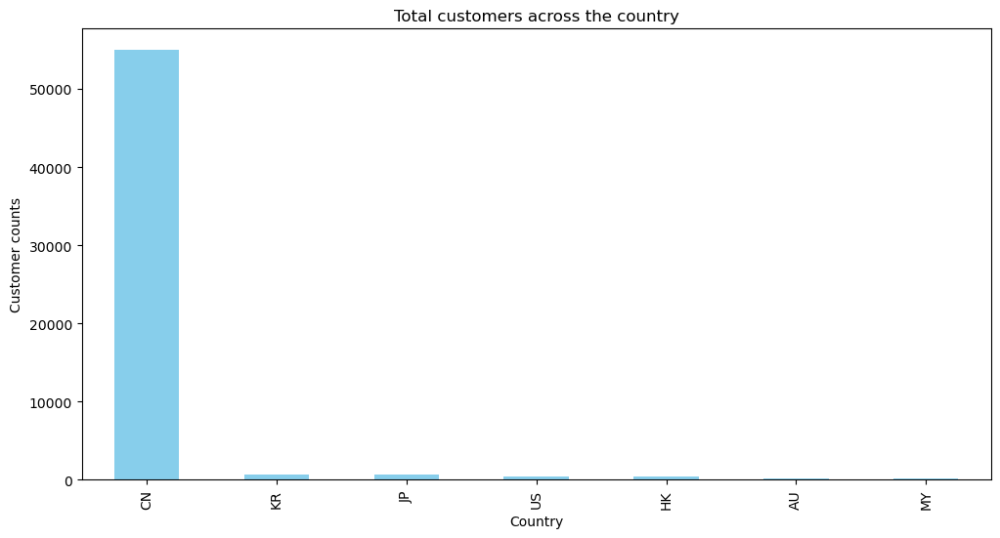

In [85]:
#disturbation for each country
country_counts = df['WORK_COUNTRY'].value_counts()
threshold = 100
filtered_country_counts = country_counts[country_counts > threshold]
plt.figure(figsize=(12, 6))
filtered_country_counts.plot(kind='bar', color='skyblue')
plt.title('Total customers across the country')
plt.xlabel('Country')
plt.ylabel('Customer counts')
plt.xticks(rotation=90)
plt.show()

In [86]:
# using only numeric columns
df=df.select_dtypes(exclude='object')
for col in df.columns:
    if df[col].dtype == 'float64':
        df[col] = df[col].astype(int)
df.dtypes

MEMBER_NO                     int64
FFP_DATE             datetime64[ns]
FIRST_FLIGHT_DATE    datetime64[ns]
GENDER                        int64
FFP_TIER                      int64
AGE                           int32
LOAD_TIME            datetime64[ns]
FLIGHT_COUNT                  int64
BP_SUM                        int64
SUM_YR_1                      int32
SUM_YR_2                      int32
SEG_KM_SUM                    int64
LAST_FLIGHT_DATE     datetime64[ns]
LAST_TO_END                   int64
AVG_INTERVAL                  int32
MAX_INTERVAL                  int64
EXCHANGE_COUNT                int64
avg_discount                  int32
Points_Sum                    int64
Point_NotFlight               int64
dtype: object

In [88]:

df.isna().sum()
df=df.dropna()

C:\Users\MSI GF75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\MSI GF75\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


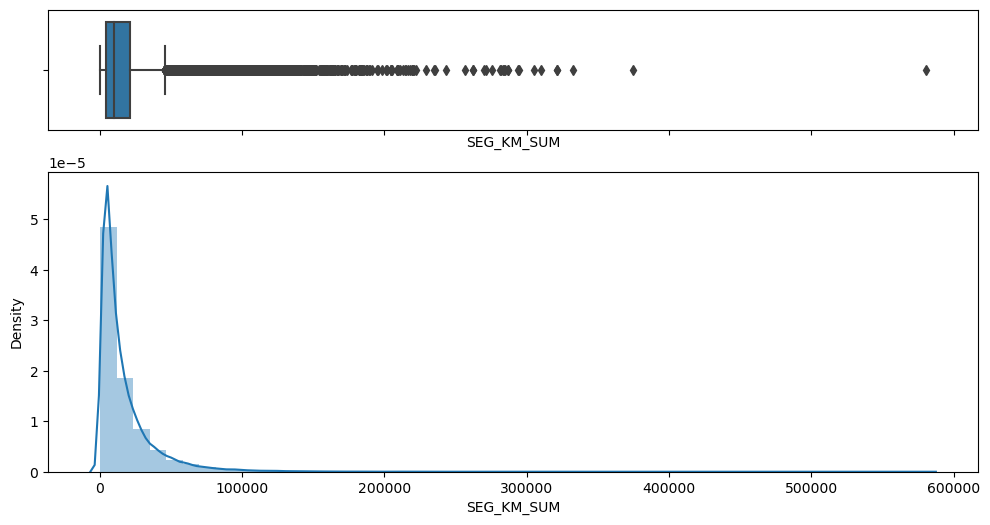

In [89]:
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.4, 1)},figsize=(12,6))
sns.boxplot(data['SEG_KM_SUM'], ax=ax_box)
sns.distplot(data['SEG_KM_SUM'], ax=ax_hist)
plt.show()

C:\Users\MSI GF75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\MSI GF75\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


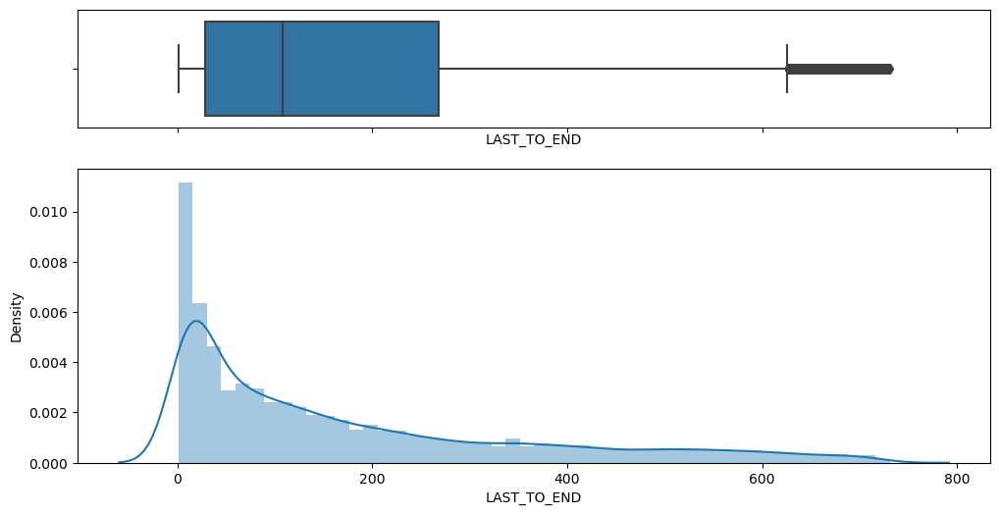

In [90]:
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.4, 1)},figsize=(12,6))
sns.boxplot(data['LAST_TO_END'], ax=ax_box)
sns.distplot(data['LAST_TO_END'], ax=ax_hist)
plt.show()

C:\Users\MSI GF75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\MSI GF75\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


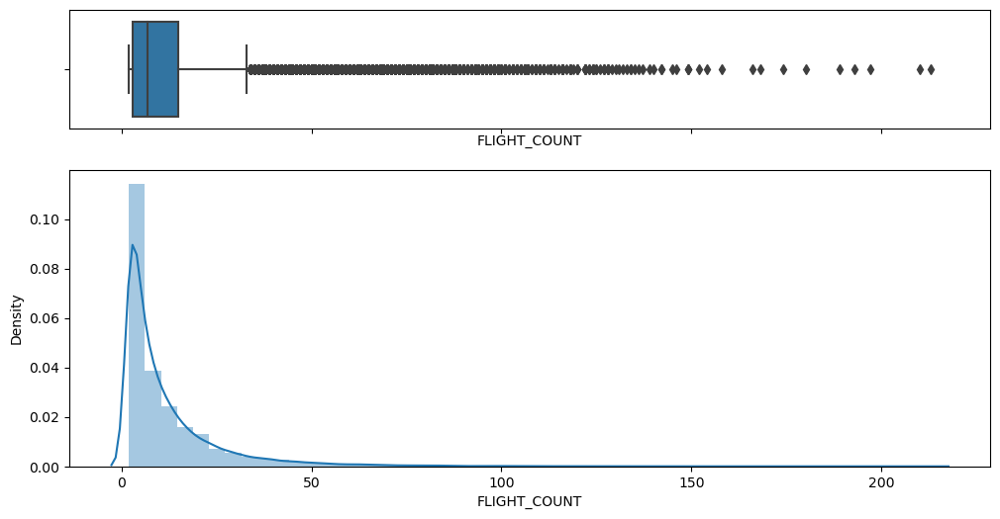

In [91]:
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.4, 1)},figsize=(12,6))
sns.boxplot(data['FLIGHT_COUNT'], ax=ax_box)
sns.distplot(data['FLIGHT_COUNT'], ax=ax_hist)
plt.show()

C:\Users\MSI GF75\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\MSI GF75\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


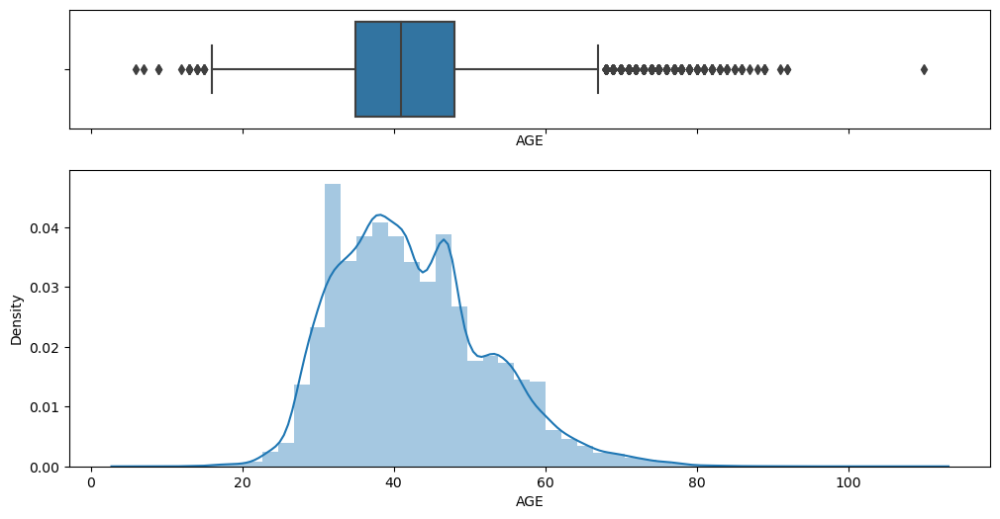

In [92]:
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.4, 1)},figsize=(12,6))
sns.boxplot(data['AGE'], ax=ax_box)
sns.distplot(data['AGE'], ax=ax_hist)
plt.show()

In [93]:
fig = px.scatter_matrix(df, dimensions= ["AGE","BP_SUM","FLIGHT_COUNT","Point_NotFlight"],
labels={col:col.replace('_', ' ') for col in df.columns},height=900, color="Points_Sum", color_continuous_scale=px.colors.diverging.Tealrose)
fig.show()

In [94]:
#Removing Outliers
def remove_outliers_iqr(data, col, threshold=1.5):
    Q1 = data[col].quantile(0.05)
    Q3 = data[col].quantile(0.95)
    IQR = Q3 - Q1
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR
    return data[(data[col] >= lower_bound) & (data[col] <= upper_bound)]

# Her sütun için outlier'ları silme işlemi yap
for col in df.columns:
    df = remove_outliers_iqr(df, col)

print(df)

       MEMBER_NO   FFP_DATE FIRST_FLIGHT_DATE  GENDER  FFP_TIER  AGE  \
412        40664 2010-06-14        2010-06-14       1         5   61   
432        35328 2011-06-02        2011-06-02       1         6   52   
453         8925 2008-03-13        2008-07-14       1         6   46   
471        30865 2009-02-01        2009-03-06       1         6   53   
478        57868 2009-07-20        2009-07-20       0         5   49   
...          ...        ...               ...     ...       ...  ...   
62981      15206 2011-12-02        2011-12-02       0         4   42   
62982      16415 2013-01-20        2013-01-20       0         4   35   
62983      18375 2011-05-20        2013-06-05       0         4   25   
62985      45690 2006-03-30        2006-12-02       0         4   43   
62986      61027 2013-02-06        2013-02-14       0         4   36   

       LOAD_TIME  FLIGHT_COUNT  BP_SUM  SUM_YR_1  SUM_YR_2  SEG_KM_SUM  \
412   2014-03-31            64   82657      3840     15403   

In [95]:
fig = px.scatter_matrix(df, dimensions= ["AGE","BP_SUM","FLIGHT_COUNT","Point_NotFlight"],
labels={col:col.replace('_', ' ') for col in df.columns},height=900, color="Points_Sum", color_continuous_scale=px.colors.diverging.Tealrose)
fig.show()

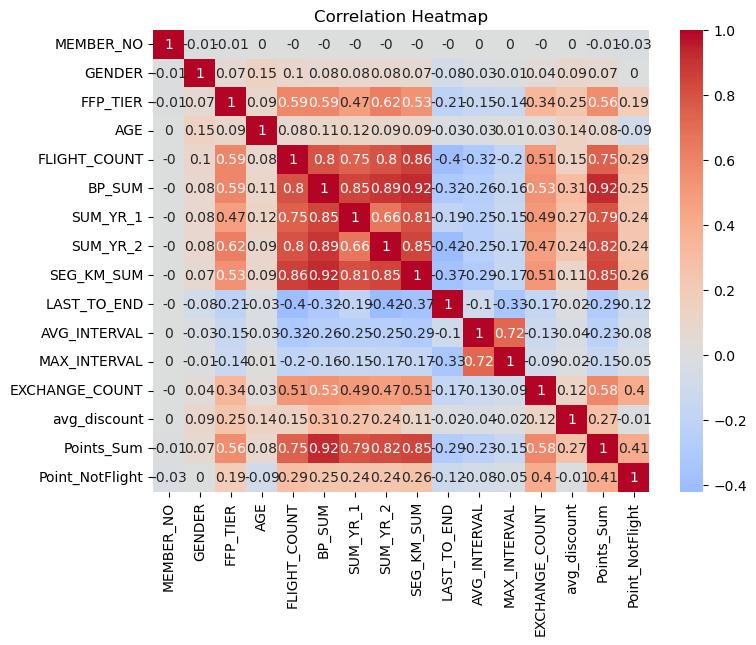

In [21]:
correlations = round(df.corr(),2)
# Output a heat map by comparing each correlation to 0.5
if (correlations > 0.5).any().any():
    plt.figure(figsize=(8, 6))
    sns.heatmap(correlations, annot=True, cmap='coolwarm', center=0)
    plt.title("Correlation Heatmap")
    plt.show()

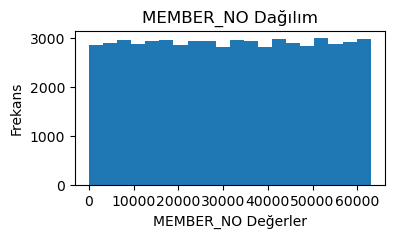

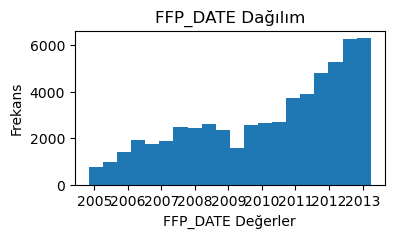

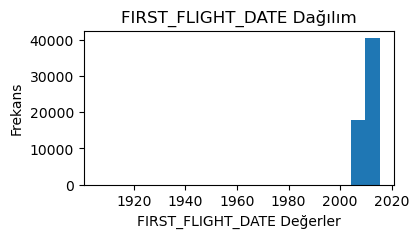

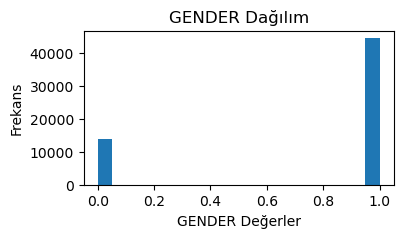

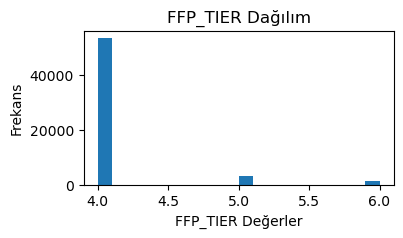

C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12290 (\N{IDEOGRAPHIC FULL STOP}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 65294 (\N{FULLWIDTH FULL STOP}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12288 (\N{IDEOGRAPHIC SPACE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12289 (\N{IDEOGRAPHIC COMMA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 57385 (\ue029) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\MSI GF75\anaconda3\l

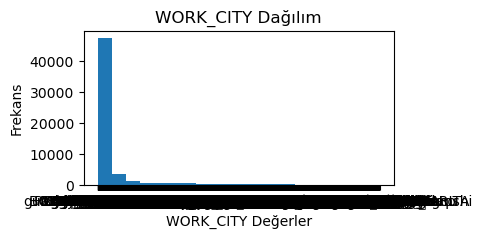

C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12289 (\N{IDEOGRAPHIC COMMA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 12288 (\N{IDEOGRAPHIC SPACE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 57380 (\ue024) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 65332 (\N{FULLWIDTH LATIN CAPITAL LETTER T}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 65335 (\N{FULLWIDTH LATIN CAPITAL LETTER W}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Us

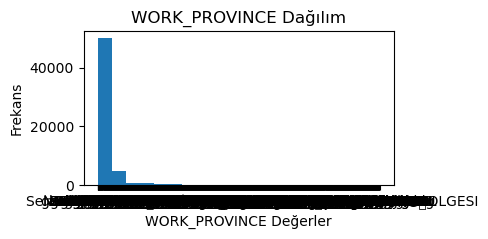

C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 20013 (\N{CJK UNIFIED IDEOGRAPH-4E2D}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 21271 (\N{CJK UNIFIED IDEOGRAPH-5317}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 27784 (\N{CJK UNIFIED IDEOGRAPH-6C88}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\MSI GF75\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 33452 (\N{CJK UNIFIED IDEOGRAPH-82AC}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


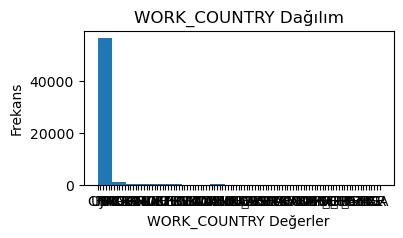

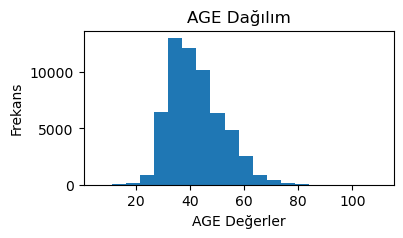

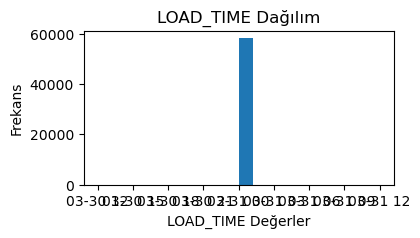

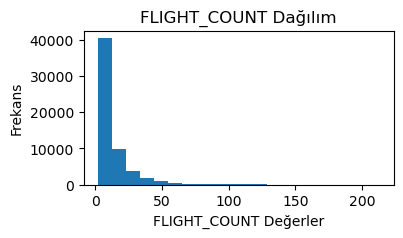

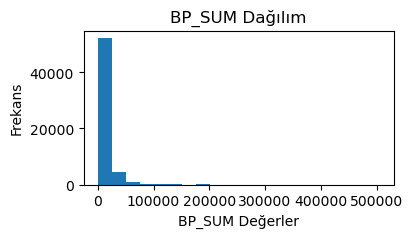

...

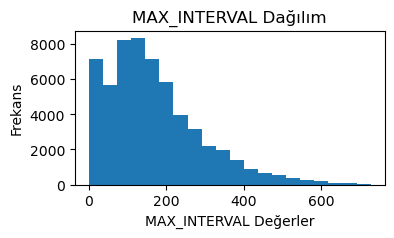

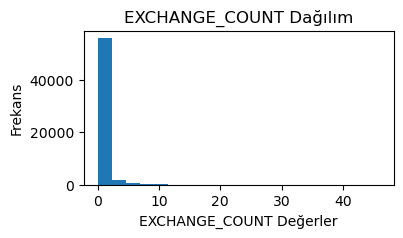

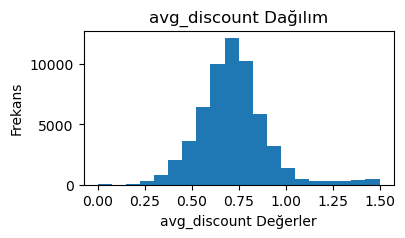

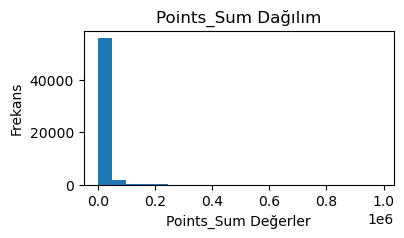

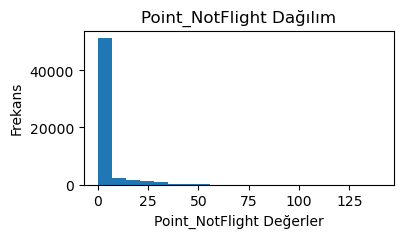

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
for col in df.columns:
    # Örnek bir sütunun histogramı çizimi
    plt.figure(figsize=(4,2))
    plt.hist(df[col], bins=20,)
    plt.xlabel(f'{col} Değerler')
    plt.ylabel('Frekans')
    plt.title(f'{col} Dağılım')
    plt.show()

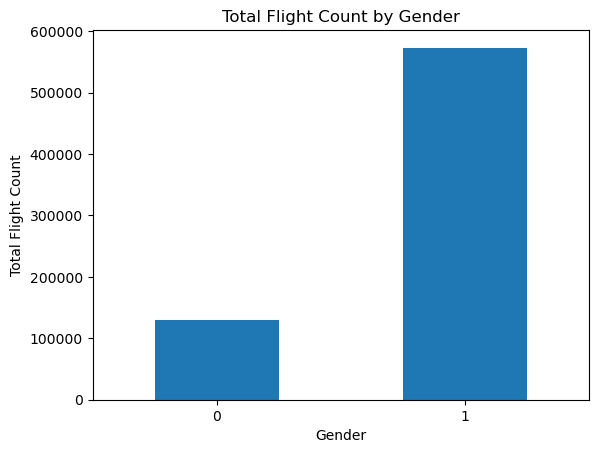

In [23]:
grouped = df.groupby('GENDER')['FLIGHT_COUNT'].sum()


grouped.plot(kind='bar')
plt.xlabel('Gender')
plt.ylabel('Total Flight Count')
plt.title('Total Flight Count by Gender')
plt.xticks(rotation=0)
plt.show()

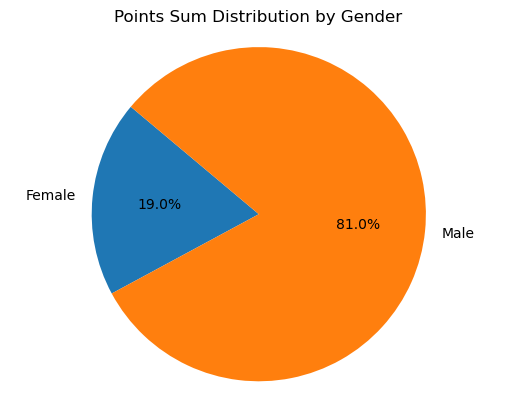

In [24]:
import matplotlib.pyplot as plt

# Group by column 'GENDER', calculate sum of column 'Points_Sum'
grouped = df.groupby('GENDER')['Points_Sum'].sum()

# Create pie 
plt.pie(grouped,labels=['Female','Male'],autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Daireyi dairesel olarak ayarlayın
plt.title('Points Sum Distribution by Gender')
plt.show()

# Feature Selection and Engineering


In [96]:
df['Length'] = ((df['LOAD_TIME'] - df['FFP_DATE']) / pd.Timedelta(days=30)).astype(int)
df['badcustomers']=df['EXCHANGE_COUNT']+df['Point_NotFlight']
df['CustomersWeight']=df['Length']+df['FFP_TIER']
print(df['CustomersWeight'].corr(df['Points_Sum']),df['badcustomers'].corr(df['Points_Sum']),df['Length'].corr(df['Points_Sum']))

0.18591010606921365 0.3816896814166017 0.18033094971556676


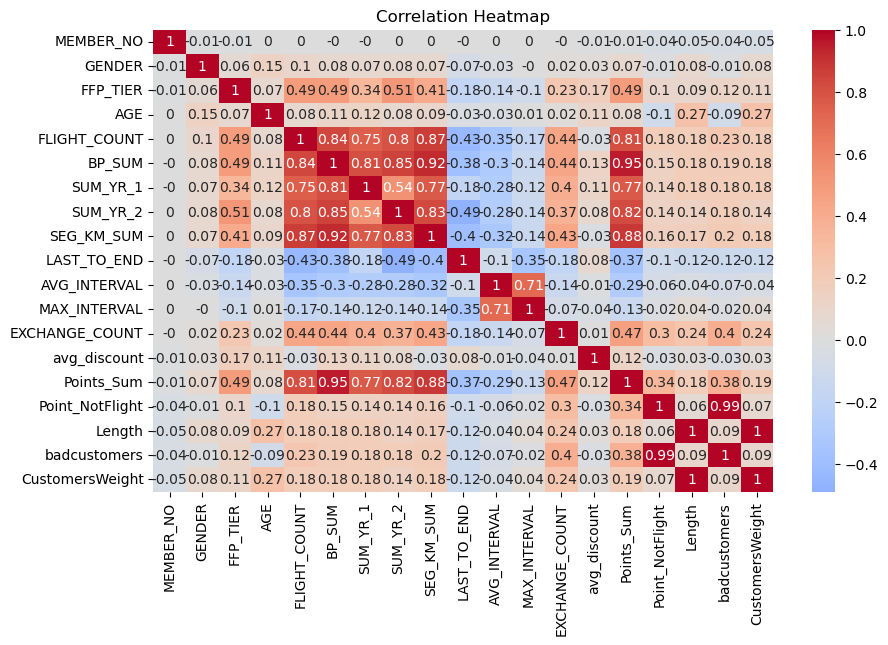

In [97]:
correlations = round(df.corr(),2)
# Output a heat map by comparing each correlation to 0.5
if (correlations > 0.5).any().any():
    plt.figure(figsize=(10, 6))
    sns.heatmap(correlations, annot=True, cmap='coolwarm', center=0)
    plt.title("Correlation Heatmap")
    plt.show()

In [98]:
from datetime import datetime
today=datetime.today()
df['Recency'] = (today - df['LAST_FLIGHT_DATE']).dt.days



In [99]:
max_recency = df['Recency'].max()

# Find the minimum value in the 'Recency' column
min_recency = df['Recency'].min()

# Print the results
print(f"Maximum Recency: {max_recency}")
print(f"Minimum Recency: {min_recency}")

Maximum Recency: 4181
Minimum Recency: 3452


In [100]:
import numpy as np
#  to divide into numbers according to a certain range
min_value = 3451
max_value =4180
num_bins = 2  

bins = np.linspace(min_value, max_value, num_bins + 1)


selected_values = []
for i in range(len(bins) - 1):
    bin_start = bins[i]
    bin_end = bins[i + 1]
    values_in_bin = np.linspace(bin_start, bin_end, 3)
    selected_values.extend(values_in_bin)

print(selected_values)

[3451.0, 3633.25, 3815.5, 3815.5, 3997.75, 4180.0]


In [101]:
def score_recency(recency):
    if recency <= 3451:
        return 5
    elif recency <= 3633.25:
        return 4
    elif recency <= 3815.5:
        return 3
    elif recency <= 3997.75:
        return 2
    elif recency <= 4180:
        return 1

df['R'] = df['Recency'].apply(score_recency)

df

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight,Length,badcustomers,CustomersWeight,Recency,R
412,40664,2010-06-14,2010-06-14,1,5,61,2014-03-31,64,82657,3840,15403,66612,2014-03-13,19,11,57,3,1,92831,12,46,15,51,3470,4.0
432,35328,2011-06-02,2011-06-02,1,6,52,2014-03-31,38,74959,43810,35025,66550,2014-03-16,16,19,81,2,1,79591,3,34,5,40,3467,4.0
453,8925,2008-03-13,2008-07-14,1,6,46,2014-03-31,36,80527,22754,41870,102876,2014-03-18,14,19,103,0,0,83035,1,73,1,79,3465,4.0
471,30865,2009-02-01,2009-03-06,1,6,53,2014-03-31,36,87291,37775,36565,72186,2014-03-11,21,19,161,5,1,90987,6,62,11,68,3472,4.0
478,57868,2009-07-20,2009-07-20,0,5,49,2014-03-31,37,87570,33765,42965,66530,2014-03-20,12,17,74,1,1,92776,4,57,5,62,3463,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62981,15206,2011-12-02,2011-12-02,0,4,42,2014-03-31,2,0,0,0,2158,2013-10-06,178,3,3,0,0,0,0,28,0,32,3628,4.0
62982,16415,2013-01-20,2013-01-20,0,4,35,2014-03-31,2,0,0,0,3848,2013-01-20,437,0,0,0,0,0,0,14,0,18,3887,2.0
62983,18375,2011-05-20,2013-06-05,0,4,25,2014-03-31,2,0,0,0,1134,2013-06-09,297,4,4,1,0,12318,22,34,23,38,3747,3.0
62985,45690,2006-03-30,2006-12-02,0,4,43,2014-03-31,2,0,0,0,2594,2014-03-03,29,166,166,0,0,0,0,97,0,101,3480,4.0


In [102]:
df['Frequency']=df['FLIGHT_COUNT']
print(df['Frequency'].max(),df['Frequency'].min())


97 2


In [103]:


min_value = 2
max_value =97
num_bins = 2 


bins = np.linspace(min_value, max_value, num_bins + 1)

# Her parçadan üç rakam seç
selected_values = []
for i in range(len(bins) - 1):
    bin_start = bins[i]
    bin_end = bins[i + 1]
    values_in_bin = np.linspace(bin_start, bin_end, 3)
    selected_values.extend(values_in_bin)

# Sonucu görüntüle
print(selected_values)

[2.0, 25.75, 49.5, 49.5, 73.25, 97.0]


In [104]:

def score_frequency(frequency):
    if frequency <= 2:
        return 5
    elif frequency <= 25.25:
        return 4
    elif frequency <= 49.5:
        return 3
    elif frequency <= 73.75 :
        return 2
    elif frequency <=97.0:
        return 1

df['F'] = df['Frequency'].apply(score_frequency)

In [105]:
df

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight,Length,badcustomers,CustomersWeight,Recency,R,Frequency,F
412,40664,2010-06-14,2010-06-14,1,5,61,2014-03-31,64,82657,3840,15403,66612,2014-03-13,19,11,57,3,1,92831,12,46,15,51,3470,4.0,64,2
432,35328,2011-06-02,2011-06-02,1,6,52,2014-03-31,38,74959,43810,35025,66550,2014-03-16,16,19,81,2,1,79591,3,34,5,40,3467,4.0,38,3
453,8925,2008-03-13,2008-07-14,1,6,46,2014-03-31,36,80527,22754,41870,102876,2014-03-18,14,19,103,0,0,83035,1,73,1,79,3465,4.0,36,3
471,30865,2009-02-01,2009-03-06,1,6,53,2014-03-31,36,87291,37775,36565,72186,2014-03-11,21,19,161,5,1,90987,6,62,11,68,3472,4.0,36,3
478,57868,2009-07-20,2009-07-20,0,5,49,2014-03-31,37,87570,33765,42965,66530,2014-03-20,12,17,74,1,1,92776,4,57,5,62,3463,4.0,37,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62981,15206,2011-12-02,2011-12-02,0,4,42,2014-03-31,2,0,0,0,2158,2013-10-06,178,3,3,0,0,0,0,28,0,32,3628,4.0,2,5
62982,16415,2013-01-20,2013-01-20,0,4,35,2014-03-31,2,0,0,0,3848,2013-01-20,437,0,0,0,0,0,0,14,0,18,3887,2.0,2,5
62983,18375,2011-05-20,2013-06-05,0,4,25,2014-03-31,2,0,0,0,1134,2013-06-09,297,4,4,1,0,12318,22,34,23,38,3747,3.0,2,5
62985,45690,2006-03-30,2006-12-02,0,4,43,2014-03-31,2,0,0,0,2594,2014-03-03,29,166,166,0,0,0,0,97,0,101,3480,4.0,2,5


In [106]:
df['MONETARY'] = df.groupby('MEMBER_NO')['SUM_YR_1', 'SUM_YR_2'].transform('sum').sum(axis=1)
print(df['MONETARY'].min(),df['MONETARY'].max())

0 87012


C:\Users\MSI GF75\AppData\Local\Temp\ipykernel_22440\1078394194.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [107]:
a = []

#  # Find rows with 'Total_Expenditure' column value 0 and 'FLIGHT_COUNT' column value less than 3 by processing each row
for index, row in df.iterrows():
    if (row['MONETARY'] == 0) and (row['FLIGHT_COUNT'] < 3) and (row['FLIGHT_COUNT'] >0) :
        a.append(index)

print(a)
df=df.drop(a)

[41940, 45704, 47257, 48981, 49616, 50189, 50301, 50773, 51183, 52445, 52586, 52802, 52912, 53005, 53045, 53551, 53869, 53951, 53953, 54038, 54067, 54221, 54328, 54536, 54734, 54749, 55212, 55269, 55275, 55561, 55755, 56211, 56360, 56646, 56942, 56977, 57361, 57807, 57909, 57941, 58090, 58241, 58642, 58861, 58947, 58977, 58980, 59208, 59359, 59411, 59509, 59589, 59590, 59743, 59915, 60041, 60305, 60511, 60632, 61309, 61564, 61983, 62430, 62527, 62918, 62928, 62980, 62981, 62982, 62983, 62985, 62986]


In [108]:
import numpy as np


min_value = 0
max_value =87012
num_bins = 2  


bins = np.linspace(min_value, max_value, num_bins + 1)


selected_values = []
for i in range(len(bins) - 1):
    bin_start = bins[i]
    bin_end = bins[i + 1]
    values_in_bin = np.linspace(bin_start, bin_end, 3)
    selected_values.extend(values_in_bin)

# Sonucu görüntüle
print(selected_values)

[0.0, 21753.0, 43506.0, 43506.0, 65259.0, 87012.0]


In [112]:
def score_monotory(MONETARY):
    if MONETARY <= 0.0:
        return 1
    elif MONETARY <= 21753.0:
        return 2
    elif MONETARY <= 43506.0:
        return 3
    elif MONETARY <= 65259.0:
        return 4
    elif MONETARY <= 87012.0:
        return 5
    else:
        return None

df['M'] = df['MONETARY'].apply(score_monotory)
df

,MEMBER_NO,FFP_DATE,FIRST_FLIGHT_DATE,GENDER,FFP_TIER,AGE,LOAD_TIME,FLIGHT_COUNT,BP_SUM,SUM_YR_1,SUM_YR_2,SEG_KM_SUM,LAST_FLIGHT_DATE,LAST_TO_END,AVG_INTERVAL,MAX_INTERVAL,EXCHANGE_COUNT,avg_discount,Points_Sum,Point_NotFlight,Length,badcustomers,CustomersWeight,Recency,R,Frequency,F,MONETARY,M
412,40664,2010-06-14,2010-06-14,1,5,61,2014-03-31,64,82657,3840,15403,66612,2014-03-13,19,11,57,3,1,92831,12,46,15,51,3470,4.0,64,2,19243,2
432,35328,2011-06-02,2011-06-02,1,6,52,2014-03-31,38,74959,43810,35025,66550,2014-03-16,16,19,81,2,1,79591,3,34,5,40,3467,4.0,38,3,78835,5
453,8925,2008-03-13,2008-07-14,1,6,46,2014-03-31,36,80527,22754,41870,102876,2014-03-18,14,19,103,0,0,83035,1,73,1,79,3465,4.0,36,3,64624,4
471,30865,2009-02-01,2009-03-06,1,6,53,2014-03-31,36,87291,37775,36565,72186,2014-03-11,21,19,161,5,1,90987,6,62,11,68,3472,4.0,36,3,74340,5
478,57868,2009-07-20,2009-07-20,0,5,49,2014-03-31,37,87570,33765,42965,66530,2014-03-20,12,17,74,1,1,92776,4,57,5,62,3463,4.0,37,3,76730,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62971,45524,2013-02-12,2013-04-03,0,4,29,2014-03-31,2,0,0,350,1096,2013-04-07,360,4,4,0,0,134,4,13,4,17,3810,3.0,2,5,350,2
62972,197,2011-01-14,2013-09-26,1,4,36,2014-03-31,2,0,0,269,1914,2013-10-04,180,8,8,1,0,20679,45,39,46,43,3630,4.0,2,5,269,2
62973,7445,2013-03-29,2013-04-06,1,4,73,2014-03-31,2,0,0,462,760,2013-04-10,357,4,4,0,0,0,0,12,0,16,3807,3.0,2,5,462,2
62976,10380,2010-07-08,2011-06-21,1,4,33,2014-03-31,2,213,284,0,1062,2014-02-22,39,420,420,1,0,213,1,45,2,49,3489,4.0,2,5,284,2


In [113]:
df.isna().sum()

MEMBER_NO            0
FFP_DATE             0
FIRST_FLIGHT_DATE    0
GENDER               0
FFP_TIER             0
AGE                  0
LOAD_TIME            0
FLIGHT_COUNT         0
BP_SUM               0
SUM_YR_1             0
SUM_YR_2             0
SEG_KM_SUM           0
LAST_FLIGHT_DATE     0
LAST_TO_END          0
AVG_INTERVAL         0
MAX_INTERVAL         0
EXCHANGE_COUNT       0
avg_discount         0
Points_Sum           0
Point_NotFlight      0
Length               0
badcustomers         0
CustomersWeight      0
Recency              0
R                    1
Frequency            0
F                    0
MONETARY             0
M                    0
dtype: int64

In [114]:
#Potential churn
df['P']=df[['Recency']].apply(lambda row: 1 if row['Recency']>=3997.75 else 0 ,axis =1)

In [115]:
# Low-Value Customers
df['LowValueCustomers']=df[['R','F','M']].apply(lambda row:1 
                                                                                    if row['R']<=2 and 
                                                                                    row['F']<=2 and 
                                                                                    row['M']<=2 else 0 ,axis=1)

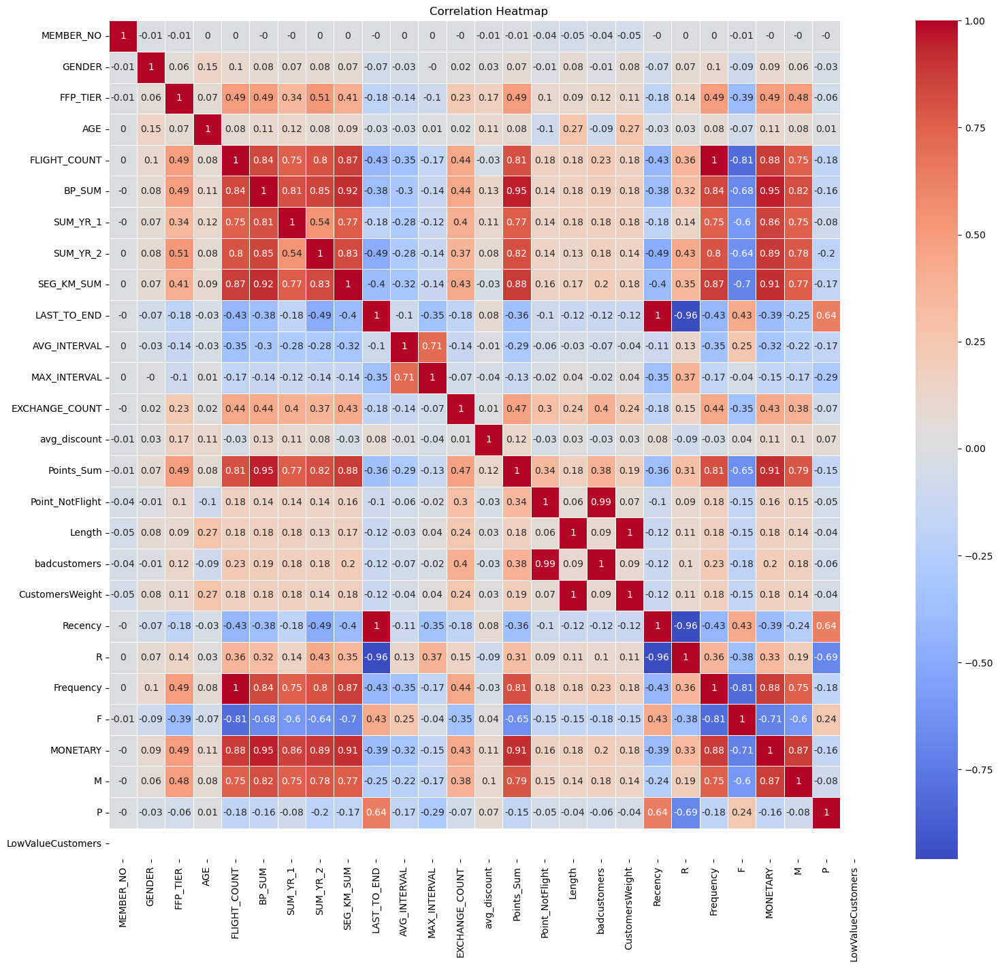

In [116]:
correlation_matrix = round(df.corr(),2)

# Heatmap
plt.figure(figsize=(18, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

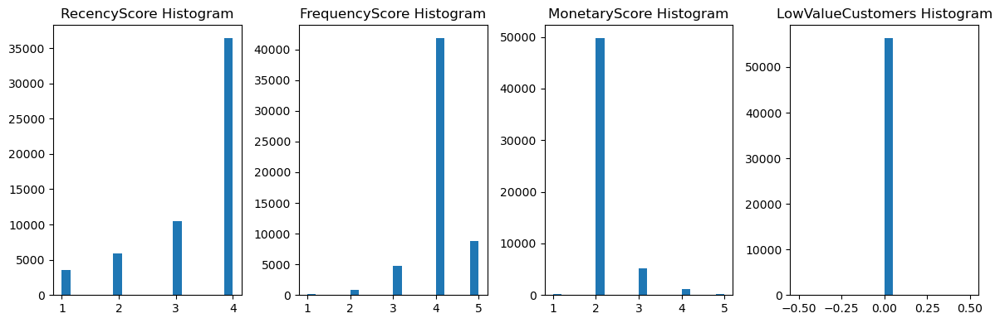

In [118]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))

# RecencyScore histogramı
plt.subplot(141)
plt.hist(df['R'], bins=20)
plt.title('RecencyScore Histogram')

# FrequencyScore histogramı
plt.subplot(142)
plt.hist(df['F'], bins=20)
plt.title('FrequencyScore Histogram')

# MonetaryScore histogramı
plt.subplot(143)
plt.hist(df['M'], bins=20)
plt.title('MonetaryScore Histogram')

# Loyal_Customers histogramı
plt.subplot(144)
plt.hist(df['LowValueCustomers'], bins=20)
plt.title('LowValueCustomers Histogram')

plt.tight_layout()
plt.show()


# Choose the Number of Clusters (K)


In [121]:
LRMF = ['Length','Recency', 'Frequency', 'MONETARY']
df1 = df[LRMF]
df1

,Length,Recency,Frequency,MONETARY
412,46,3470,64,19243
432,34,3467,38,78835
453,73,3465,36,64624
471,62,3472,36,74340
478,57,3463,37,76730
...,...,...,...,...
62971,13,3810,2,350
62972,39,3630,2,269
62973,12,3807,2,462
62976,45,3489,2,284


In [122]:
# Scaling Data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()


df_scaled = scaler.fit_transform(df1)

df_scaled = pd.DataFrame(df_scaled, columns=df1.columns)

print(df_scaled)

         Length   Recency  Frequency  MONETARY
0      0.333333  0.024691   0.652632  0.221153
1      0.215686  0.020576   0.378947  0.906024
2      0.598039  0.017833   0.357895  0.742702
3      0.490196  0.027435   0.357895  0.854365
4      0.441176  0.015089   0.368421  0.881832
...         ...       ...        ...       ...
56375  0.009804  0.491084   0.000000  0.004022
56376  0.264706  0.244170   0.000000  0.003092
56377  0.000000  0.486968   0.000000  0.005310
56378  0.323529  0.050754   0.000000  0.003264
56379  0.235294  0.384088   0.000000  0.004252

[56380 rows x 4 columns]


In [123]:
df_scaled.isna().sum()

Length       0
Recency      0
Frequency    0
MONETARY     0
dtype: int64

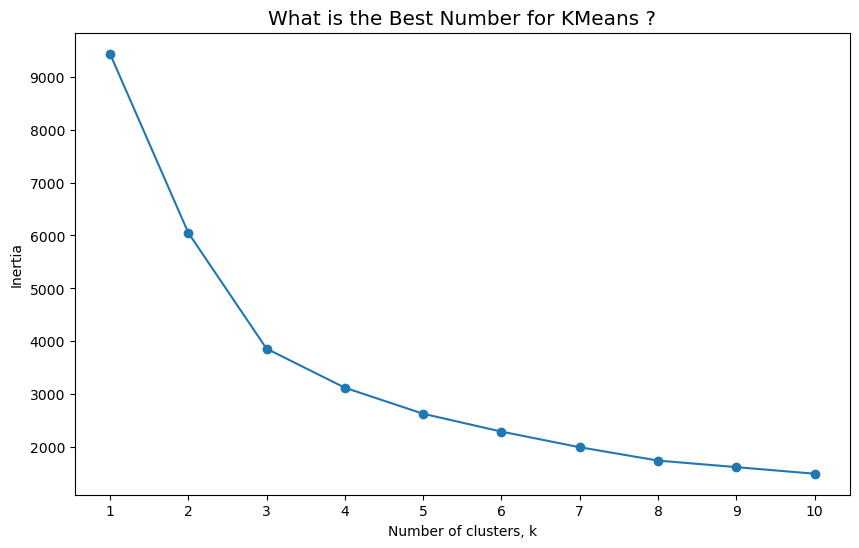

In [124]:
from sklearn.cluster import KMeans
ks = range(1,11)
inertias=[]
for k in ks :
    kc = KMeans(n_clusters=k,random_state=142)
    kc.fit(df_scaled)
    cluster = kc.fit_predict(df_scaled)
    inertias.append(kc.inertia_)
# Plot ks vs inertias
f, ax = plt.subplots(figsize=(10, 6))
plt.plot(ks, inertias, '-o')
plt.xlabel('Number of clusters, k')
plt.ylabel('Inertia')
plt.xticks(ks)
plt.style.use('ggplot')
plt.title('What is the Best Number for KMeans ?')
plt.show()

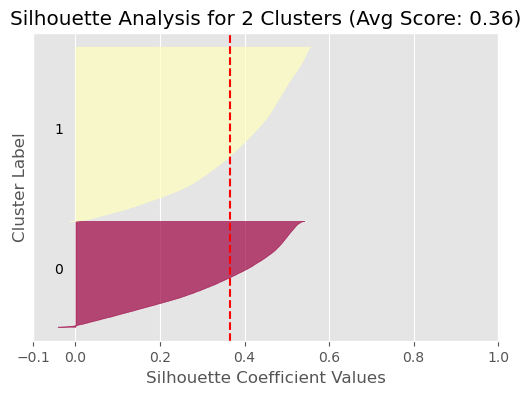

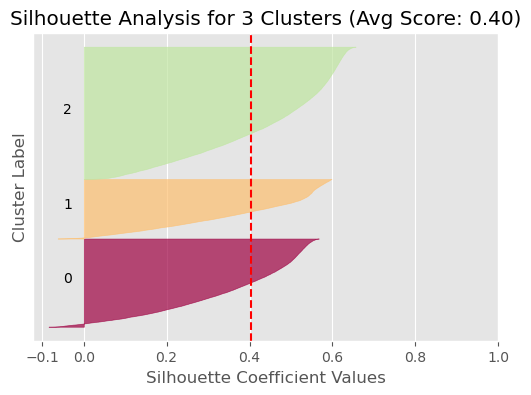

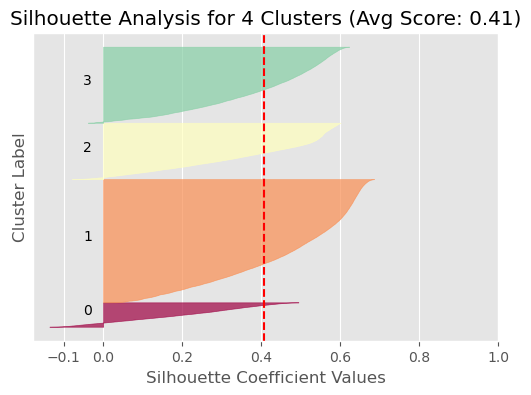

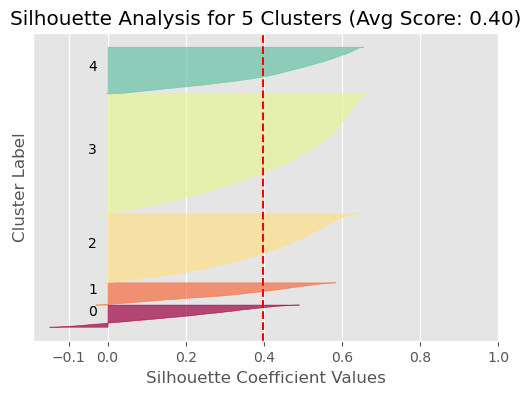

In [125]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import numpy as np
cluster_numbers=[2,3,4,5]

data_array=df_scaled.to_numpy()
for n_clusters in cluster_numbers:
    # K-Means modelini oluşturun
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(data_array)

    # Calculate Silhouette score
    silhouette_avg = silhouette_score(data_array, cluster_labels)

    # Calculate Silhoutte score for each sample
    sample_silhouette_values = silhouette_samples(data_array, cluster_labels)

    plt.figure(figsize=(6, 4))
    plt.title(f'Silhouette Analysis for {n_clusters} Clusters (Avg Score: {silhouette_avg:.2f})')
    y_lower = 10

    for i in range(n_clusters):
     
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = plt.cm.get_cmap("Spectral")(float(i) / n_clusters)
        plt.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    plt.xlabel("Silhouette Coefficient Values")
    plt.ylabel("Cluster Label")
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    plt.yticks([])
    plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    plt.show()

# Model Selection  Model Training


In [126]:
kc = KMeans(init='k-means++',n_clusters= 4, random_state=142)
kc.fit(df_scaled)
cluster_labels = kc.labels_

df_c = df_scaled.assign(K_Cluster = cluster_labels)
data_label=df1.assign(K_Cluster = cluster_labels)

In [138]:
data_f=df_c.groupby('K_Cluster').mean()
data_f['count']=pd.value_counts(df_c['K_Cluster'])
df_c


,Length,Recency,Frequency,MONETARY,K_Cluster
0,0.333333,0.024691,0.652632,0.221153,3
1,0.215686,0.020576,0.378947,0.906024,3
2,0.598039,0.017833,0.357895,0.742702,3
3,0.490196,0.027435,0.357895,0.854365,3
4,0.441176,0.015089,0.368421,0.881832,3
...,...,...,...,...,...
56375,0.009804,0.491084,0.000000,0.004022,0
56376,0.264706,0.244170,0.000000,0.003092,2
56377,0.000000,0.486968,0.000000,0.005310,0
56378,0.323529,0.050754,0.000000,0.003264,2


# Interpret the Results


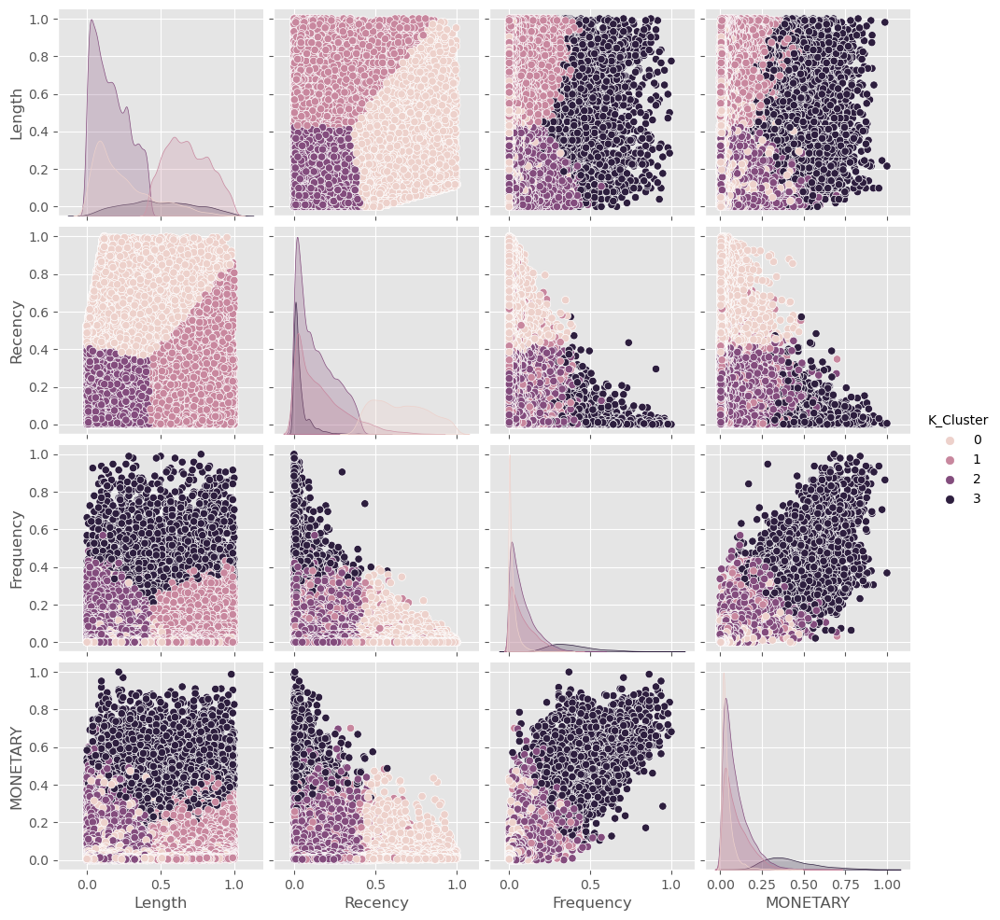

In [131]:
sns.pairplot(data=df_c, hue='K_Cluster')

In [137]:
data_c=df_c.groupby('K_Cluster').mean()
data_c['count']=pd.value_counts(df_c['K_Cluster'])
df_c

,Length,Recency,Frequency,MONETARY,K_Cluster
0,0.333333,0.024691,0.652632,0.221153,3
1,0.215686,0.020576,0.378947,0.906024,3
2,0.598039,0.017833,0.357895,0.742702,3
3,0.490196,0.027435,0.357895,0.854365,3
4,0.441176,0.015089,0.368421,0.881832,3
...,...,...,...,...,...
56375,0.009804,0.491084,0.000000,0.004022,0
56376,0.264706,0.244170,0.000000,0.003092,2
56377,0.000000,0.486968,0.000000,0.005310,0
56378,0.323529,0.050754,0.000000,0.003264,2


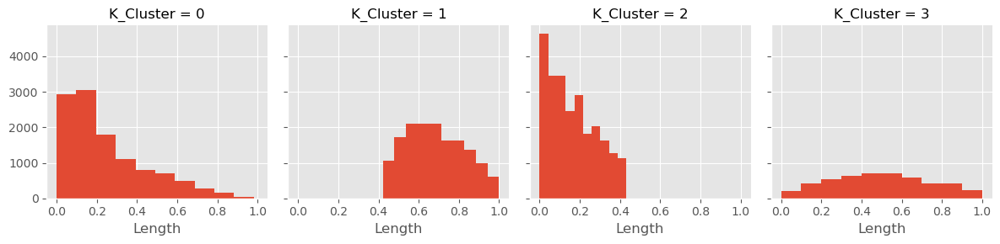

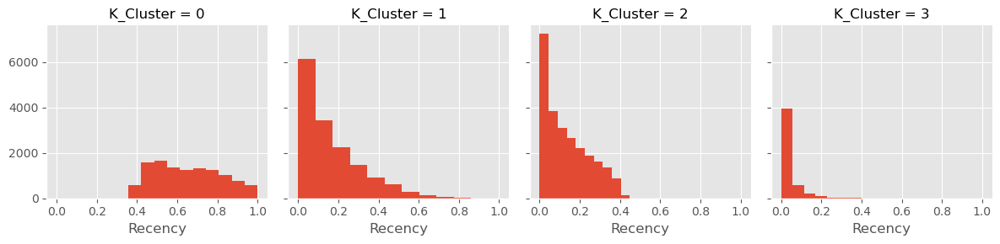

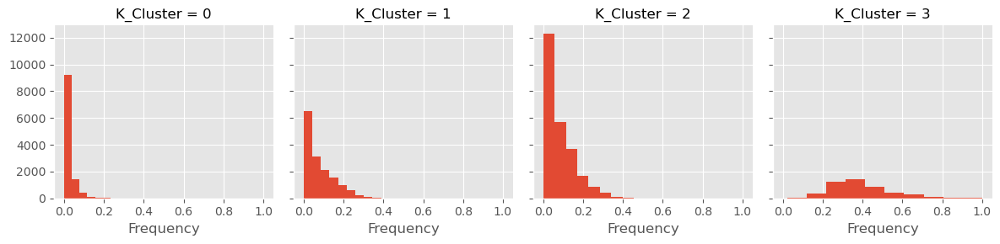

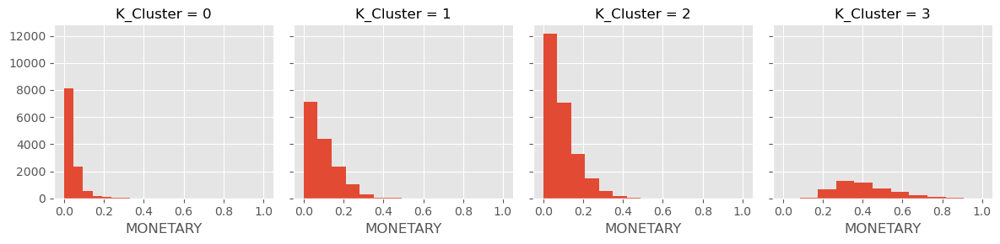

In [141]:
for c in df_c.drop(['K_Cluster'],axis=1):
    grid= sns.FacetGrid(df_c, col='K_Cluster')
    grid= grid.map(plt.hist, c)
plt.show()


# Implement Segmentation

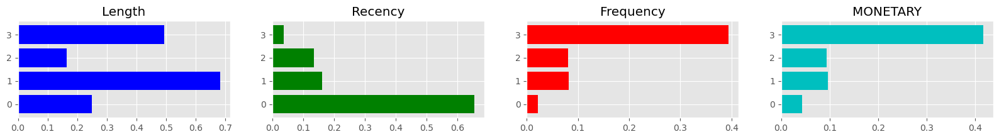

In [142]:
LRFM = ['Length','Recency', 'Frequency', 'MONETARY']
def dist_list(lst):
    plt.figure(figsize=[len(lst)*5,2])
    i = 1
    cl = ['bgrcmykw'[c] for c in range(len('bgrcmykw'))]
    for col in lst:
        ax = plt.subplot(1,len(lst),i)
        g = df_c.groupby('K_Cluster')
        x = g[col].mean().index
        y = g[col].mean().values
        ax.barh(x,y,color=cl[i-1])
        plt.title(col)
        i = i+1
        
dist_list(LRFM)

In [143]:
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(n_components=4, random_state=142, covariance_type='full').fit(df_scaled)
prediction_gmm = gmm.predict(df_scaled)
probs = gmm.predict_proba(df_scaled)
data_d=df_scaled.assign(GMM_Cluster = prediction_gmm)
data_labelg=df1.assign(GMM_Cluster = prediction_gmm)

In [145]:
data_g=data_d.groupby('GMM_Cluster').mean()
data_g['count']=pd.value_counts(data_d['GMM_Cluster'])
data_g

,Length,Recency,Frequency,MONETARY,count
GMM_Cluster,,,,,
0,0.138316,0.190433,0.087674,0.103970,13345
1,0.627541,0.144722,0.092933,0.105652,10198
2,0.310720,0.392641,0.013932,0.030938,22873
3,0.444426,0.043044,0.299914,0.319259,9964


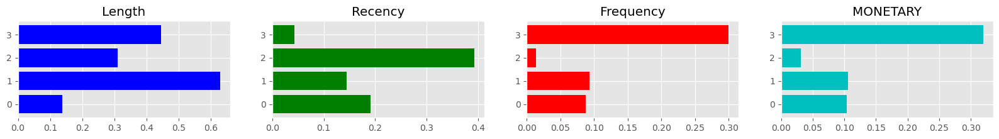

In [148]:
LRFM = ['Length','Recency', 'Frequency', 'MONETARY']
def dist_list(lst):
    plt.figure(figsize=[len(lst)*5,2])
    i = 1
    cl = ['bgrcmykw'[c] for c in range(len('bgrcmykw'))]
    for col in lst:
        ax = plt.subplot(1,len(lst),i)
        g = data_d.groupby('GMM_Cluster')
        x = g[col].mean().index
        y = g[col].mean().values
        ax.barh(x,y,color=cl[i-1])
        plt.title(col)
        i = i+1
        
dist_list(LRFM)

CPU times: total: 3.86 s
Wall time: 564 ms


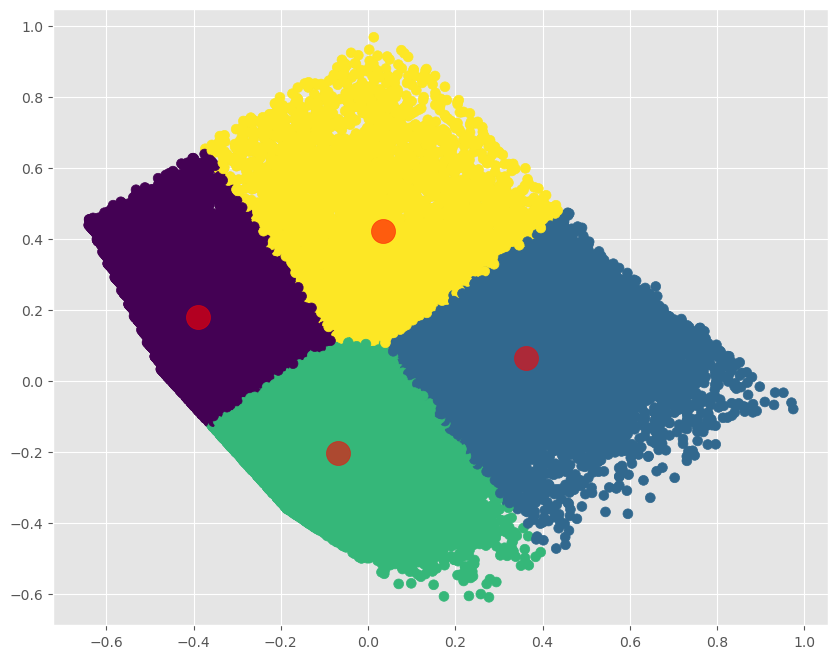

In [149]:
x=df_c.drop('K_Cluster', axis=1)
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
n_clusters = 4
sklearn_pca = PCA(n_components = 2)
Y_sklearn = sklearn_pca.fit_transform(df_scaled)
kmeans = KMeans(n_clusters= n_clusters, max_iter=600,random_state=150, algorithm = 'auto')

%time fitted = kmeans.fit(Y_sklearn)
prediction = kmeans.predict(Y_sklearn)
df_pred=df_scaled.assign(K_Cluster = prediction)
targets = [0, 1, 2,3]
plt.figure(figsize = (10,8))
plt.scatter(Y_sklearn[:, 0], Y_sklearn[:, 1],c=prediction ,s=50, cmap='viridis')
centers2 = fitted.cluster_centers_
plt.scatter(centers2[:, 0], centers2[:, 1],c='red', s=300, alpha=0.6);

In [150]:
df_pred

,Length,Recency,Frequency,MONETARY,K_Cluster
0,0.333333,0.024691,0.652632,0.221153,2
1,0.215686,0.020576,0.378947,0.906024,2
2,0.598039,0.017833,0.357895,0.742702,1
3,0.490196,0.027435,0.357895,0.854365,1
4,0.441176,0.015089,0.368421,0.881832,1
...,...,...,...,...,...
56375,0.009804,0.491084,0.000000,0.004022,0
56376,0.264706,0.244170,0.000000,0.003092,2
56377,0.000000,0.486968,0.000000,0.005310,0
56378,0.323529,0.050754,0.000000,0.003264,2


In [151]:
df_pred1=df_pred.groupby('K_Cluster').mean()
df_pred1['count']=pd.value_counts(df_pred['K_Cluster'])
df_pred1['Clusters']=[0,1,2,3]
df_pred1

,Length,Recency,Frequency,MONETARY,count,Clusters
K_Cluster,,,,,,
0,0.152702,0.612343,0.020945,0.041838,10148,0
1,0.673980,0.086685,0.156664,0.173156,15306,1
2,0.174496,0.117389,0.104105,0.118233,25507,2
3,0.639312,0.533656,0.029324,0.048533,5419,3


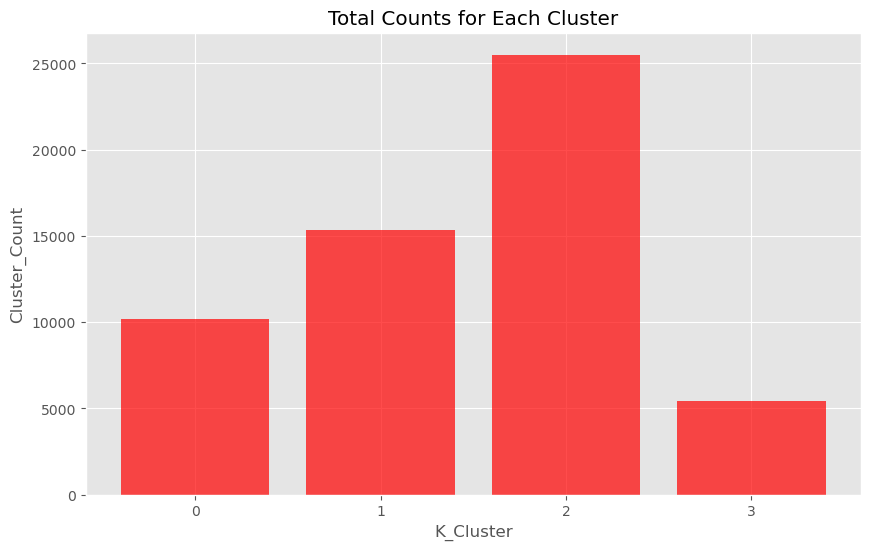

In [152]:

import matplotlib.pyplot as plt
# Kümeleri ve toplam sayıları alın
clusters = df_pred1['Clusters']
cluster_counts = df_pred1['count']

# Bar grafiği çizin
plt.figure(figsize=(10, 6))
plt.bar(clusters, cluster_counts, color='red', alpha=0.7)
plt.xlabel('K_Cluster')
plt.ylabel('Cluster_Count')
plt.title('Total Counts for Each Cluster')
plt.xticks(clusters)
plt.show()

# 10) Evaluation


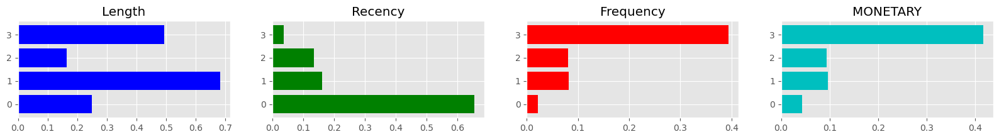

In [153]:
#  USE K-MEANS MODELS

LRFM = ['Length','Recency', 'Frequency', 'MONETARY']
def dist_list(lst):
    plt.figure(figsize=[len(lst)*5,2])
    i = 1
    cl = ['bgrcmykw'[c] for c in range(len('bgrcmykw'))]
    for col in lst:
        ax = plt.subplot(1,len(lst),i)
        g = df_c.groupby('K_Cluster')
        x = g[col].mean().index
        y = g[col].mean().values
        ax.barh(x,y,color=cl[i-1])
        plt.title(col)
        i = i+1
        
dist_list(LRFM)

0-General Customers
1-Loyal Customers
2-Potential Customers
3-Important Customers



# Cluster 0 -General Customers:



# Cluster 1 Loyal Customers

# Cluster 2 Potential Customers:


# Cluster 3 Important Customers

# Deployment 

In [168]:
import pickle

#Save a model
with open('final_KMEANS.pkl', 'wb') as model_file:
    pickle.dump(kc, model_file)

In [169]:
df_c.to_csv('F_KMEANS.csv',index=False)